In [1]:
# This is the import cell
import sys
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)
import matplotlib.ticker as ticker
from collections import OrderedDict
from scipy import stats
from PIL import Image
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import pylab as plot
first = True
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", 10)



# Here are my rc parameters for matplotlibf
fsize = 20
mpl.rc('font', serif='Helvetica Neue')
#mpl.rc('font', serif='Times New Roman')
mpl.rcParams.update({'font.size': fsize})
mpl.rcParams['figure.figsize'] = 3.2, 2.8
mpl.rcParams['figure.dpi'] = 500
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['lines.linewidth'] = 1.5
mpl.rcParams['axes.linewidth'] = 1.5
# Set x tick params
mpl.rcParams['xtick.major.size'] = 4.5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['xtick.minor.size'] = 3.
mpl.rcParams['xtick.minor.width'] = 1.25
# Set y tick params
mpl.rcParams['ytick.major.size'] = 4.5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['ytick.minor.size'] = 3.
mpl.rcParams['ytick.minor.width'] = 1.25
mpl.rcParams['legend.fontsize']= 20.
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams["font.family"] = "Times New Roman"
# Load LaTeX and amsmath
# mpl.rc('text', usetex=True)
# mpl.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

In [2]:
# Get the current path
if first:
    parent = os.getcwd()
print(parent)
# Grab file names from data folder
dens = os.listdir('../../../../../../../../Volumes/EXTERNAL2/leakage_final')

try:
    dens.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres2 = os.listdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/BubComp')
try:
    pres2.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres3 = os.listdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/PhaseComp')
try:
    pres3.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres5 = os.listdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/lat_end')
try:
    pres5.remove('.DS_Store')
except:
    print(".DS_Store not in directory")  

/Users/nicklauersdorf/klotsa/ABPs/post_proc/Jupyter
.DS_Store not in directory


In [3]:
# Some functions to get the relevant data from the filenames
def checkFile(fname, string):
    for i in range(len(fname)):
        if fname[i] == string[0]:
#             print"{} matches {}".format(fname[i], string[0])
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
#                     print"{} matches {}".format(fname[i+j], string[j])
                    if j == (len(string) - 1):
#                         print"Final match!"
                        return True
                else:
                    break
    return False
    
def txtValue(fname, string):
    out = ""
    index = 0
    for i in range(len(fname)):
        if fname[i] == string[0]:
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
                    if j == (len(string) - 1):
                        # Last index of search string
                        index = i + j
                else:
                    break
                        
    # First index of value
    index += 1
    mybool = True
    while mybool:
        if fname[index].isdigit():
            out = out + fname[index]
            index += 1
        elif fname[index] == ".":    
            if fname[index+1].isdigit():
                out = out + fname[index]
                index += 1
            else:
                mybool = False
        else:
            mybool = False
    return float(out)

# Sorting functions
def multiSort(arr1, arr2, arr3, arr4):
    """Sort an array the slow (but certain) way, returns original indices in sorted order"""
    # Doing this for PeR, PeS, xS in this case
    cpy1 = np.copy(arr1)
    cpy2 = np.copy(arr2)
    cpy3 = np.copy(arr3)
    cpy4 = np.copy(arr4)
    ind = np.arange(0, len(arr1))
    for i in range(len(cpy1)):
        for j in range(len(cpy1)):
            # Sort by first variable
            if cpy1[i] > cpy1[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            # If first variable is equal, resort to second variable
            elif cpy1[i] == cpy1[j] and cpy2[i] > cpy2[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] > cpy3[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] == cpy3[j] and cpy4[i] > cpy4[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
    return ind

def indSort(arr1, arr2):
    """Take sorted index array, use to sort array"""
    # arr1 is array to sort
    # arr2 is index array
    cpy = np.copy(arr1)
    for i in range(len(arr1)):
        arr1[i] = cpy[arr2[i]]

In [4]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in dens:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 
                
# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(dens, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_dens = []
os.chdir(parent)
os.chdir('../../../../../../../../Volumes/EXTERNAL2/leakage_final')
for i in dens:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_dens.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_dens[0])

,tst,clust_size,Ngas_to_bulk,Nsgas_to_bulk,Nfgas_to_bulk,Nbulk_to_gas,Nsbulk_to_gas,Nfbulk_to_gas,Ngas_to_int,Nsgas_to_int,Nfgas_to_int,Nint_to_gas,Nsint_to_gas,Nfint_to_gas,Nbulk_to_int,Nsbulk_to_int,Nfbulk_to_int,Nint_to_bulk,Nsint_to_bulk,Nfint_to_bulk
0,0.0,40318,0,0,0,0,0,0,936,483,453,1781,25,1756,2031,1020,1011,465,242,223
1,0.3,3,0,0,0,0,0,0,1381,393,988,2529,120,2409,3903,1965,1938,54,34,20
2,0.6,2,0,0,0,0,0,0,2337,851,1486,2537,92,2445,7876,3944,3932,0,0,0
3,0.9,2,0,0,0,0,0,0,3407,1446,1961,2419,58,2361,8235,4113,4122,0,0,0
4,1.2,2,0,0,0,0,0,0,4413,2064,2349,2705,208,2497,6894,3423,3471,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,598.2,1,6381,4207,2174,1358,414,944,18069,12004,6065,4208,1175,3033,3168,1004,2164,3767,1051,2716
1995,598.5,1,6365,4209,2156,1465,431,1034,18016,11979,6037,4095,1139,2956,3409,1046,2363,3703,1009,2694
1996,598.8,1,6186,4132,2054,1189,354,835,17454,11738,5716,4797,1400,3397,2811,846,1965,4280,1249,3031
1997,599.1,1,6334,4231,2103,1234,358,876,17776,11954,5822,4592,1331,3261,2946,867,2079,3986,1111,2875


In [5]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params = pd.DataFrame(columns=headers)
for i in range(0, len(all_dens)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params = params.append(df, ignore_index = True)
display(params)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,400,50.0,1.0,60.0,0.000001
1,0,0,450,50.0,1.0,60.0,0.000001
2,0,0,100,50.0,1.0,60.0,0.000001
3,0,0,150,50.0,1.0,60.0,0.000001
4,0,0,300,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
51,0,400,450,50.0,1.0,60.0,0.000001
52,0,400,500,50.0,1.0,60.0,0.000001
53,0,450,450,50.0,1.0,60.0,0.000001
54,0,450,500,50.0,1.0,60.0,0.000001


In [6]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_dens)):
    # Ger rid of NaN in favor of 0
    all_dens[i].fillna(0, inplace=True)

headers=list(all_dens[0])
display(all_dens[0])
print(all_dens[0][headers[1]][0])
print(all_dens[0][headers[2]][0])

,tst,clust_size,Ngas_to_bulk,Nsgas_to_bulk,Nfgas_to_bulk,Nbulk_to_gas,Nsbulk_to_gas,Nfbulk_to_gas,Ngas_to_int,Nsgas_to_int,Nfgas_to_int,Nint_to_gas,Nsint_to_gas,Nfint_to_gas,Nbulk_to_int,Nsbulk_to_int,Nfbulk_to_int,Nint_to_bulk,Nsint_to_bulk,Nfint_to_bulk
0,0.0,40318,0,0,0,0,0,0,936,483,453,1781,25,1756,2031,1020,1011,465,242,223
1,0.3,3,0,0,0,0,0,0,1381,393,988,2529,120,2409,3903,1965,1938,54,34,20
2,0.6,2,0,0,0,0,0,0,2337,851,1486,2537,92,2445,7876,3944,3932,0,0,0
3,0.9,2,0,0,0,0,0,0,3407,1446,1961,2419,58,2361,8235,4113,4122,0,0,0
4,1.2,2,0,0,0,0,0,0,4413,2064,2349,2705,208,2497,6894,3423,3471,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,598.2,1,6381,4207,2174,1358,414,944,18069,12004,6065,4208,1175,3033,3168,1004,2164,3767,1051,2716
1995,598.5,1,6365,4209,2156,1465,431,1034,18016,11979,6037,4095,1139,2956,3409,1046,2363,3703,1009,2694
1996,598.8,1,6186,4132,2054,1189,354,835,17454,11738,5716,4797,1400,3397,2811,846,1965,4280,1249,3031
1997,599.1,1,6334,4231,2103,1234,358,876,17776,11954,5822,4592,1331,3261,2946,867,2079,3986,1111,2875


40318
0


In [7]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres2:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres2, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new = []
os.chdir(parent)
os.chdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/BubComp')
for i in pres2:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new[-1])
print(storeVals)

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,edge_begin,edge_end,NBin
0,0.0,5.016308,46185,1,1,15060,14930,93.955659,1.388671,609.782144,393.375583,37.181567,2.825347,56.774092,93.955659,824
1,0.3,5.016308,46839,1,1,14820,14777,84.574353,1.242565,549.999213,334.476099,32.889894,2.132484,51.684459,84.574353,668
2,0.6,5.016308,46183,1,1,11697,11815,87.037020,2.746320,576.239633,409.606877,25.324441,3.103850,61.712579,87.037020,594
3,0.9,5.016308,44807,1,1,9237,9376,87.294978,1.848126,576.532794,451.871906,19.484822,2.828571,67.810156,87.294978,506
4,1.2,5.016308,44146,1,1,8727,8885,87.170994,2.688556,575.971278,459.058721,18.367236,2.327537,68.803759,87.170994,487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029,598.2,5.016308,43532,1,1,9856,10031,87.263886,12.823748,626.310692,503.230220,21.040081,3.586445,66.223804,87.263886,562
2030,598.5,5.016308,43706,2,2,9317,9342,87.548404,11.334780,604.886147,516.097256,19.547983,4.609567,68.000421,87.548404,526
2031,598.8,5.016308,43896,2,2,9487,9500,87.570433,11.279537,605.929890,517.937281,20.352324,8.622440,67.218109,87.570433,537
2032,599.1,5.016308,43812,1,1,9181,9315,87.071983,10.469581,609.343415,508.821739,19.323276,5.037382,67.748707,87.071983,511


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 10.0, 10.0, 10.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 30.0, 30.0, 30.0, 30.0, 30.0, 40.0, 40.0, 40.0, 40.0, 40.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 90.0, 90.0, 90.0, 90.0, 90.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 110.0, 110.0, 110.0,

In [8]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params3 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params3 = params3.append(df, ignore_index = True)
display(params3)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,100,50.0,1.0,60.0,0.000001
1,0,0,150,50.0,1.0,60.0,0.000001
2,0,0,400,50.0,1.0,60.0,0.000001
3,0,0,450,50.0,1.0,60.0,0.000001
4,0,0,300,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
110,0,400,400,50.0,1.0,60.0,0.000001
111,0,400,450,50.0,1.0,60.0,0.000001
112,0,450,500,50.0,1.0,60.0,0.000001
113,0,450,450,50.0,1.0,60.0,0.000001


In [9]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new)):
    # Ger rid of NaN in favor of 0
    all_pres_new[i].fillna(0, inplace=True)

headers=list(all_pres_new[0])
display(all_pres_new[0])
print(all_pres_new[0][headers[1]][0])
print(all_pres_new[0][headers[2]][0])

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,edge_begin,edge_end,NBin
0,0.0,5.016308,12,1,1,21320,21205,50.792963,25.008366,797.004789,0.0,0.0,0.0,0.0,0.0,2214
1,0.0,5.016308,12,1,0,3680,3795,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,387
2,0.3,5.016308,1009,1,1,21954,21966,8.031308,0.223465,50.757647,0.0,0.0,0.0,0.0,0.0,2287
3,0.3,5.016308,1009,1,0,3046,3034,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,314
4,0.6,5.016308,1111,1,1,21468,21520,17.125215,5.321723,134.663038,0.0,0.0,0.0,0.0,0.0,2234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4515,598.8,5.016308,1596,1,3,135,142,6.854810,1.223745,47.191792,0.0,0.0,0.0,0.0,0.0,15
4516,599.1,5.016308,2351,1,1,20515,20680,8.031308,0.223465,50.757647,0.0,0.0,0.0,0.0,0.0,2132
4517,599.1,5.016308,2351,1,0,4485,4320,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,469
4518,599.4,5.016308,3318,1,1,20203,20165,11.193240,1.153822,71.943384,0.0,0.0,0.0,0.0,0.0,2090


5.016308
12


In [10]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres3:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres3, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new2 = []
os.chdir(parent)
os.chdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/PhaseComp')
for i in pres3:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new2.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new2[-1])
print(storeVals)

,tauB,sizeBin,clust_size,Na_bulk,Nb_bulk,NBin_bulk,Na_gas,Nb_gas,NBin_gas,Na_int,Nb_int,NBin_int,Na_bub,Nb_bub,NBin_bub
0,0.0,5.016308,46185,8326,8150,356,1614,1920,1421,15060,14930,824,0,0,0
1,0.3,5.016308,46839,8886,8722,295,1294,1501,1638,14820,14777,668,0,0,0
2,0.6,5.016308,46183,11691,11361,425,1612,1824,1582,11697,11815,594,0,0,0
3,0.9,5.016308,44807,13493,13192,519,2270,2432,1576,9237,9376,506,0,0,0
4,1.2,5.016308,44146,13679,13380,535,2594,2735,1579,8727,8885,487,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,598.2,5.016308,43532,12222,12058,470,2922,2911,1569,9856,10031,562,0,0,0
1995,598.5,5.016308,43706,12840,12798,497,2843,2860,1578,9317,9342,526,0,0,0
1996,598.8,5.016308,43896,12802,12742,499,2711,2758,1565,9487,9500,537,0,0,0
1997,599.1,5.016308,43812,12976,12869,508,2843,2816,1582,9181,9315,511,0,0,0


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 10.0, 10.0, 10.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 30.0, 30.0, 30.0, 30.0, 30.0, 40.0, 40.0, 40.0, 40.0, 40.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 90.0, 90.0, 90.0, 90.0, 90.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 110.0, 110.0, 110.0,

In [11]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params4 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new2)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params4 = params4.append(df, ignore_index = True)
display(params4)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,200,50.0,1.0,60.0,0.000001
1,0,0,250,50.0,1.0,60.0,0.000001
2,0,0,500,50.0,1.0,60.0,0.000001
3,0,0,400,50.0,1.0,60.0,0.000001
4,0,0,450,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
110,0,400,400,50.0,1.0,60.0,0.000001
111,0,400,450,50.0,1.0,60.0,0.000001
112,0,450,500,50.0,1.0,60.0,0.000001
113,0,450,450,50.0,1.0,60.0,0.000001


In [12]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new2)):
    # Ger rid of NaN in favor of 0
    all_pres_new2[i].fillna(0, inplace=True)

headers=list(all_pres_new2[0])
display(all_pres_new2[0])
print(all_pres_new2[0][headers[1]][0])
print(all_pres_new2[0][headers[2]][0])

,tauB,sizeBin,clust_size,Na_bulk,Nb_bulk,NBin_bulk,Na_gas,Nb_gas,NBin_gas,Na_int,Nb_int,NBin_int,Na_bub,Nb_bub,NBin_bub
0,0.0,5.016308,28426,3467,3442,188,10105,10072,1691,11428,11486,722,0,0,0
1,0.3,5.016308,28249,4148,4099,175,10458,9422,1781,10394,11479,645,0,0,0
2,0.6,5.016308,29801,4869,4800,215,9791,8338,1688,10340,11862,698,0,0,0
3,0.9,5.016308,30789,6610,6584,306,9099,7357,1581,8927,10733,652,364,326,62
4,1.2,5.016308,31180,7388,7309,347,8526,6602,1474,8698,10803,714,388,286,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,598.2,5.016308,18464,2121,3931,149,19350,13739,2106,3529,7330,346,0,0,0
1995,598.5,5.016308,19110,1571,3002,112,17261,12136,1898,5159,9110,475,1009,752,116
1996,598.8,5.016308,19669,1724,3294,124,17660,12460,1925,4309,8366,406,1307,880,146
1997,599.1,5.016308,19291,1970,3364,131,19177,13614,2080,3743,7942,379,110,80,11


5.016308
28426


In [13]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres5:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres5, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new4 = []
os.chdir(parent)
os.chdir('../../../../../../../../Volumes/EXTERNAL2/final_videos/txt_files_final/lat_end')
for i in pres5:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new4.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new4[-1])
print(storeVals)

,tauB,sizeBin,clust_size,lat_theory,bulk_mean,bulk_std,int_mean,int_std,dense_mean,dense_std
0,0.0,5.016308,46185,0.800055,0.794146,0.007208,0.843673,0.228717,0.826111,0.185317
1,0.3,5.016308,46839,0.800055,0.698075,0.010403,0.764274,0.220419,0.739581,0.177559
2,0.6,5.016308,46183,0.800055,0.732097,0.013822,0.805238,0.252271,0.769029,0.183212
3,0.9,5.016308,44807,0.800055,0.752199,0.019078,0.834362,0.275310,0.785960,0.181640
4,1.2,5.016308,44146,0.800055,0.758741,0.023628,0.840501,0.279204,0.790976,0.180746
...,...,...,...,...,...,...,...,...,...,...
1994,598.2,5.016308,43532,0.800055,0.750916,0.024934,0.840940,0.295337,0.791451,0.204015
1995,598.5,5.016308,43706,0.800055,0.751335,0.024113,0.840029,0.294513,0.788695,0.196953
1996,598.8,5.016308,43896,0.800055,0.754415,0.026122,0.843960,0.300282,0.792595,0.201987
1997,599.1,5.016308,43812,0.800055,0.756657,0.026573,0.842066,0.280401,0.792284,0.187034


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 10.0, 10.0, 10.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 30.0, 30.0, 30.0, 30.0, 30.0, 40.0, 40.0, 40.0, 40.0, 40.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 90.0, 90.0, 90.0, 90.0, 90.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 110.0, 110.0, 1

In [14]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params6 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new4)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params6 = params6.append(df, ignore_index = True)
display(params6)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,500,50.0,1.0,60.0,0.000001
1,0,0,250,50.0,1.0,60.0,0.000001
2,0,0,200,50.0,1.0,60.0,0.000001
3,0,0,300,50.0,1.0,60.0,0.000001
4,0,0,450,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
111,0,400,500,50.0,1.0,60.0,0.000001
112,0,400,400,50.0,1.0,60.0,0.000001
113,0,450,450,50.0,1.0,60.0,0.000001
114,0,450,500,50.0,1.0,60.0,0.000001


In [15]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new4)):
    # Ger rid of NaN in favor of 0
    all_pres_new4[i].fillna(0, inplace=True)

headers=list(all_pres_new4[0])
display(all_pres_new4[0])
print(all_pres_new4[0][headers[1]][0])
print(all_pres_new4[0][headers[2]][0])

,tauB,sizeBin,clust_size,lat_theory,bulk_mean,bulk_std,int_mean,int_std,dense_mean,dense_std
0,0.0,5.016308,42332,0.846778,0.834331,0.010179,0.887086,0.226374,0.868635,0.184368
1,0.3,5.016308,41232,0.842864,0.729563,0.018739,0.845485,0.282323,0.801932,0.230312
2,0.6,5.016308,40815,0.842457,0.756553,0.018506,0.871494,0.264702,0.820058,0.205260
3,0.9,5.016308,39605,0.841677,0.772742,0.021820,0.907883,0.296053,0.838104,0.217252
4,1.2,5.016308,38489,0.842424,0.777983,0.022619,0.934922,0.326764,0.856521,0.244637
...,...,...,...,...,...,...,...,...,...,...
1994,598.2,5.016308,29639,0.832061,0.770199,0.031560,0.887791,0.235345,0.847444,0.199604
1995,598.5,5.016308,30562,0.832914,0.767270,0.030256,0.903286,0.253146,0.864305,0.223074
1996,598.8,5.016308,28777,0.830206,0.767811,0.032911,0.903076,0.277427,0.864181,0.242681
1997,599.1,5.016308,27340,0.828698,0.767725,0.034847,0.892074,0.264074,0.856874,0.231251


5.016308
42332


0
400
1580.02


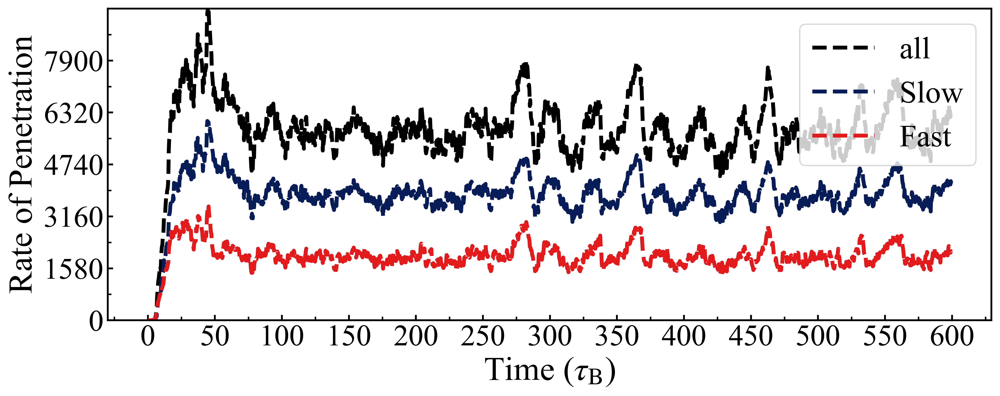

453.35


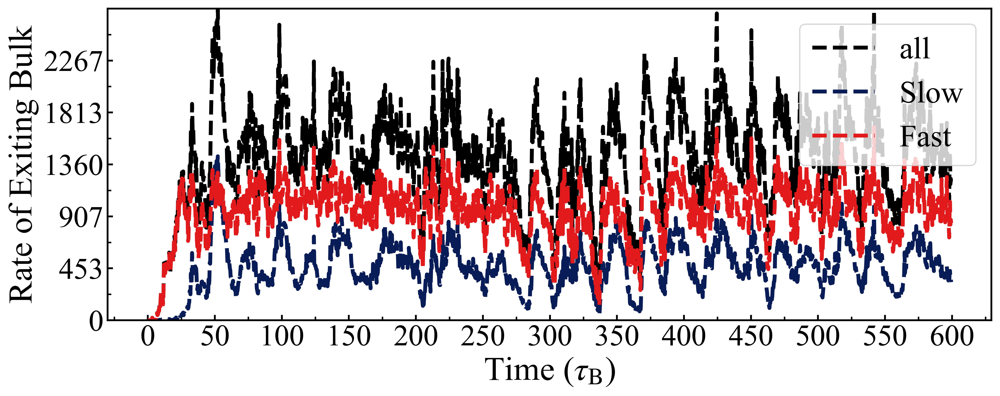

0
450
1753.02


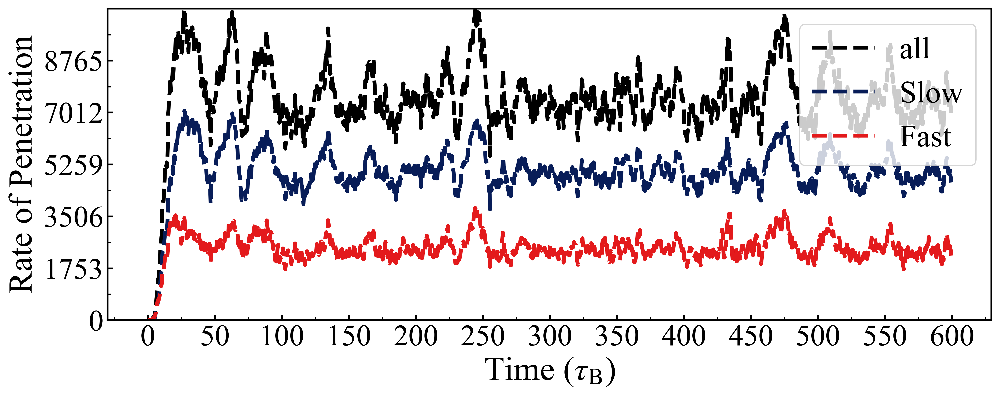

389.02


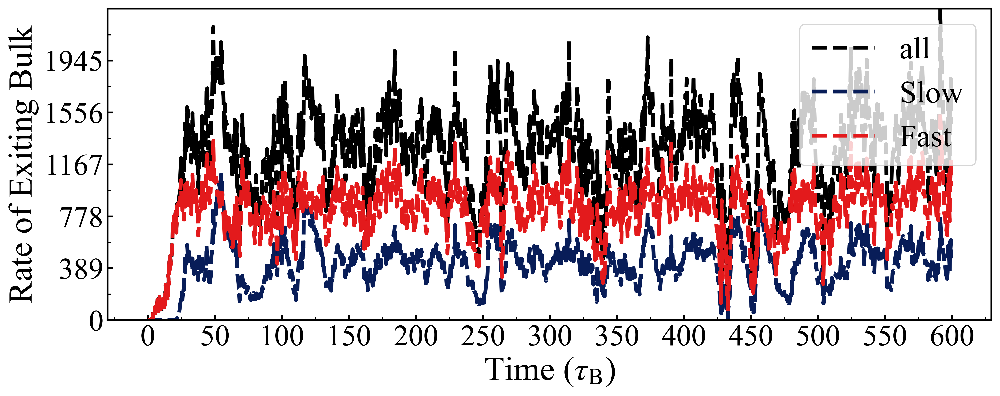

0
150
66.02


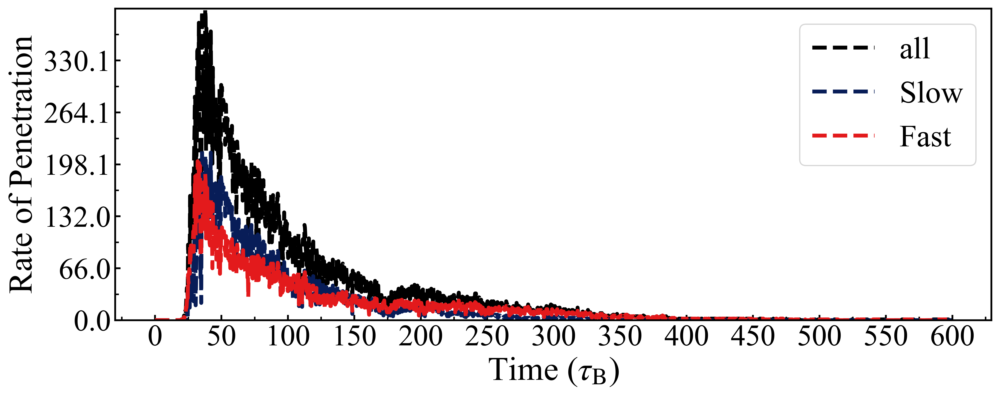

1192.18


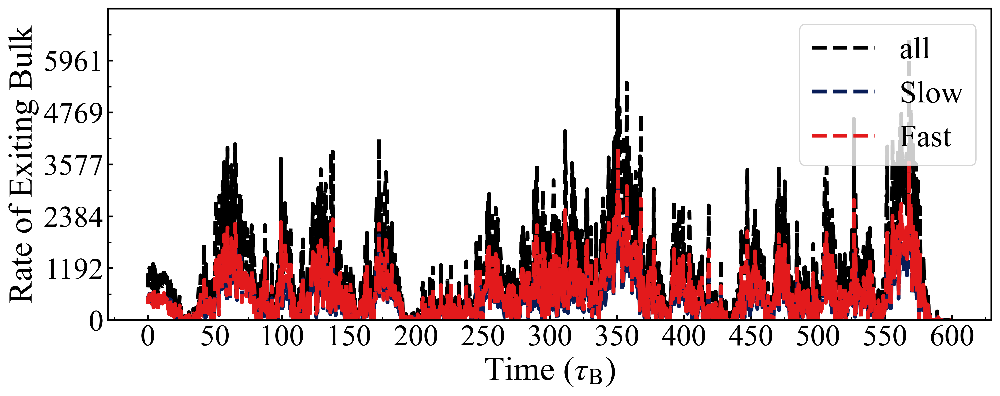

0
300
1252.02


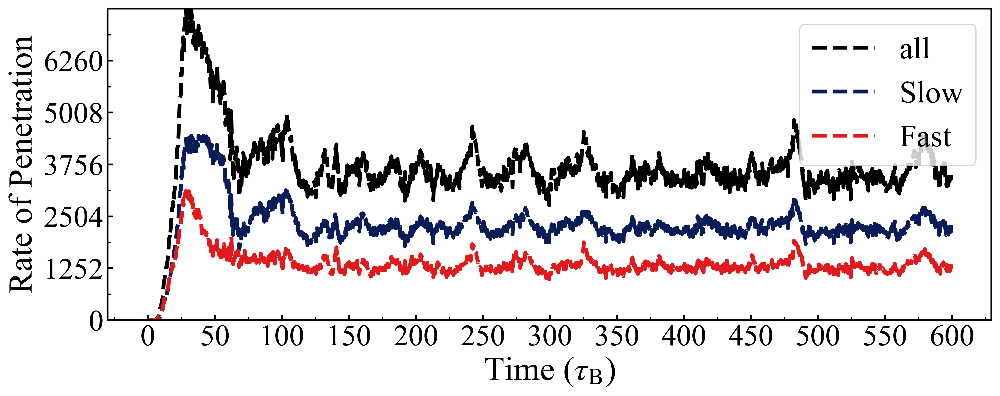

543.85


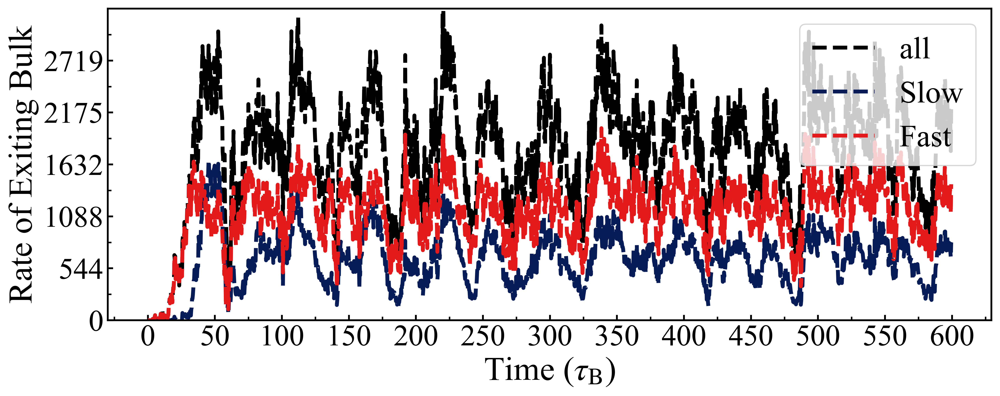

0
200
1237.85


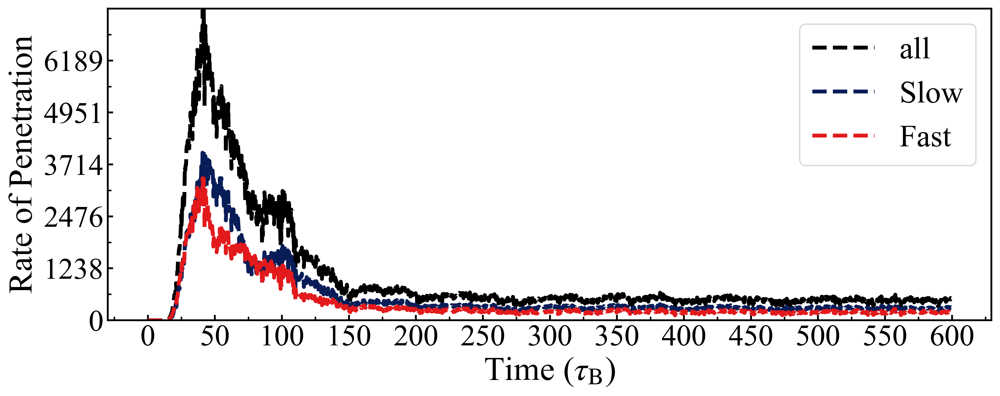

1025.35


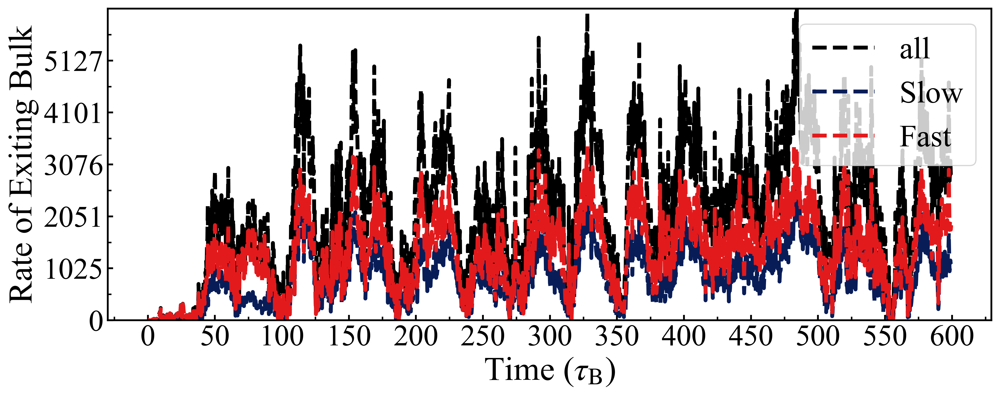

0
250
1140.52


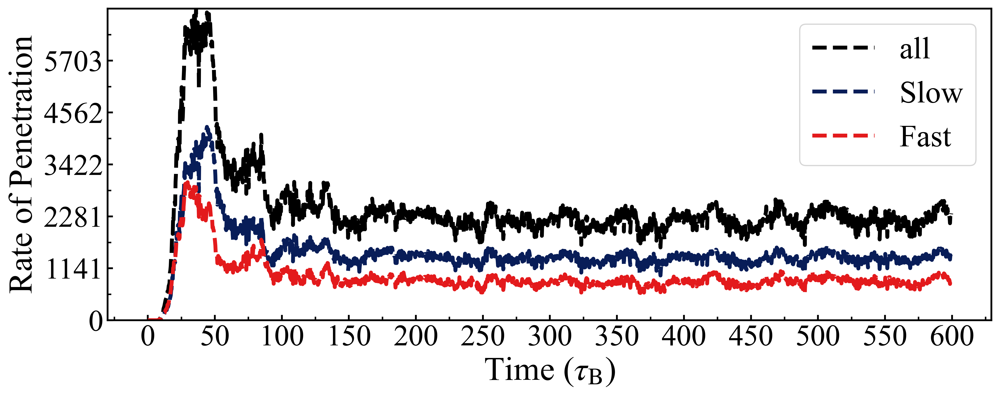

940.35


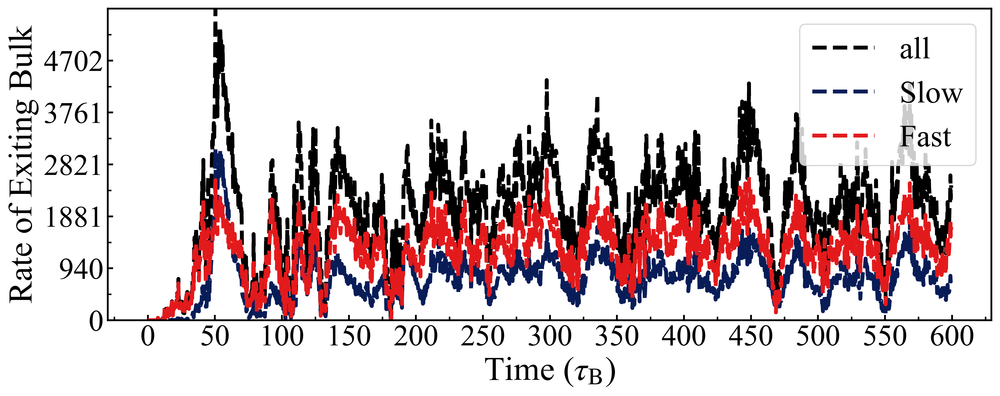

0
500
1848.35


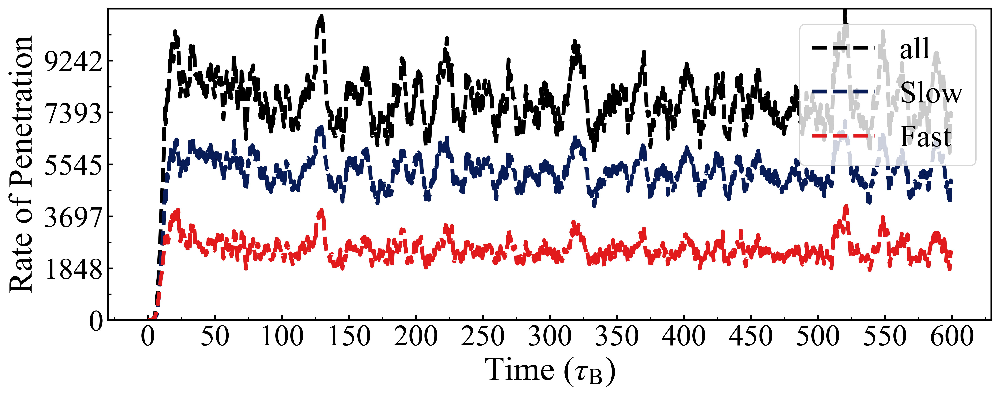

342.35


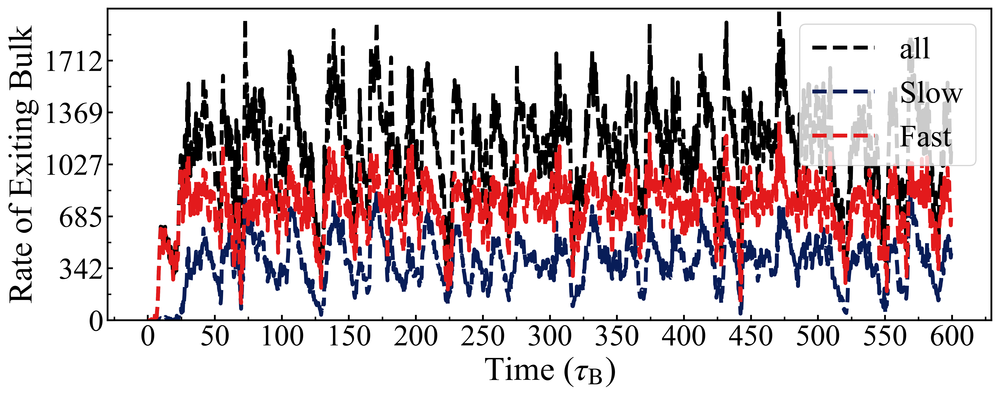

50
500
1710.85


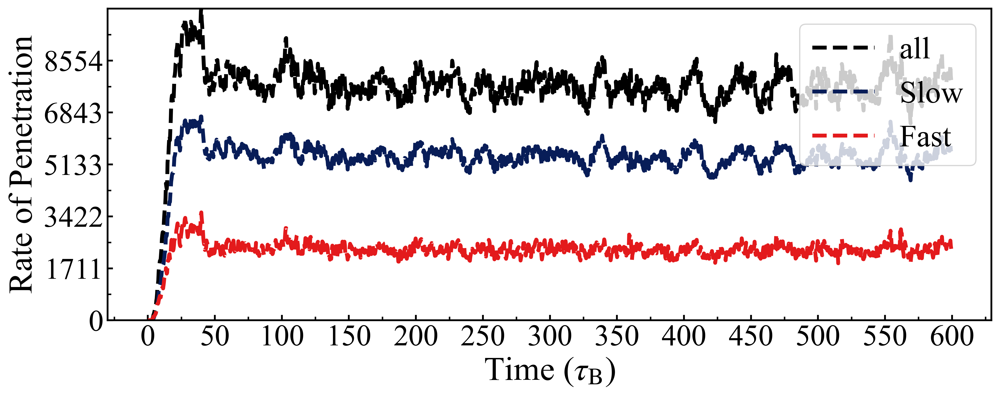

291.52


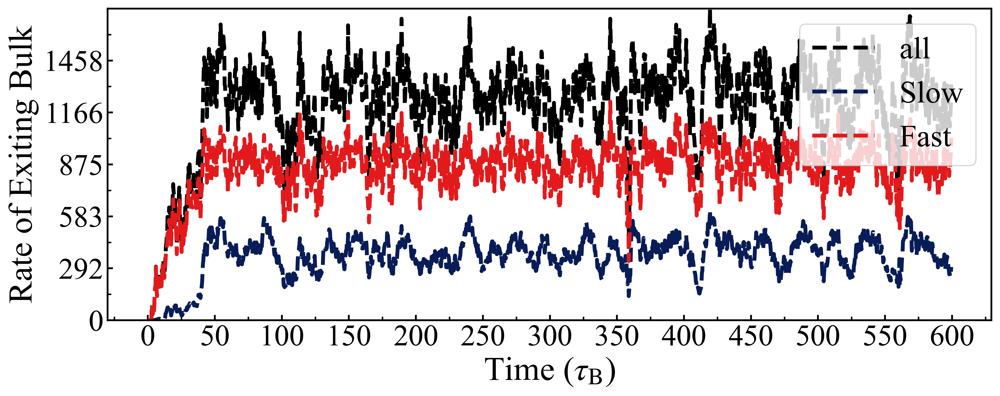

50
400
1419.35


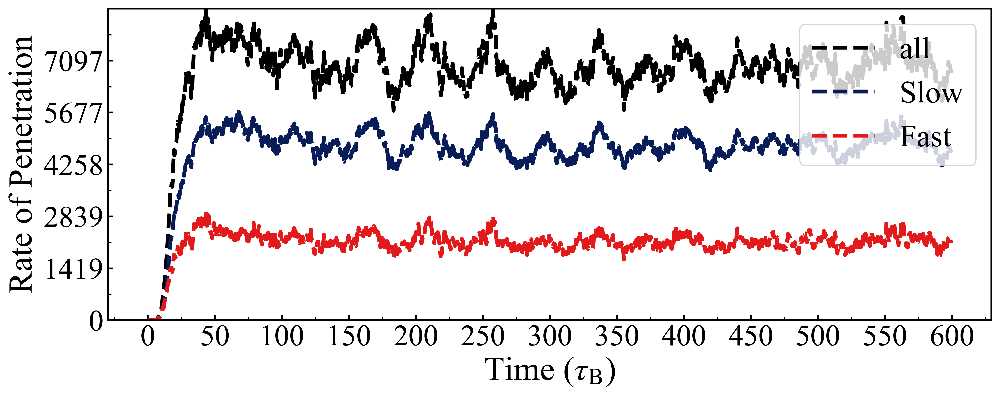

356.85


KeyboardInterrupt: 

In [16]:


gas_to_bulk_mean = np.array([])
slow_gas_to_bulk_mean = np.array([])
fast_gas_to_bulk_mean = np.array([])

gas_to_int_mean = np.array([])
slow_gas_to_int_mean = np.array([])
fast_gas_to_int_mean = np.array([])

bulk_to_int_mean = np.array([])
slow_bulk_to_int_mean = np.array([])
fast_bulk_to_int_mean = np.array([])

bulk_to_gas_mean = np.array([])
slow_bulk_to_gas_mean = np.array([])
fast_bulk_to_gas_mean = np.array([])

int_to_gas_mean = np.array([])
slow_int_to_gas_mean = np.array([])
fast_int_to_gas_mean = np.array([])

int_to_bulk_mean = np.array([])
slow_int_to_bulk_mean = np.array([])
fast_int_to_bulk_mean = np.array([])

slow_act = np.array([])
fast_act = np.array([])

time=np.array([])

bulk_lat_mean_mean = np.array([])

bulk_nA_mean = np.array([])
bulk_nB_mean = np.array([])
bulk_n_mean = np.array([])


int_n_mean = np.array([])
int_nA_mean =np.array([])
int_nB_mean =np.array([])

gas_n_mean =np.array([])
gas_nA_mean = np.array([])
gas_nB_mean = np.array([])

dense_n_mean = np.array([])
dense_nA_mean = np.array([])
dense_nB_mean = np.array([])
adsorp_rate = np.array([])  

bub_width_mean = np.array([])
bub_surface_area_mean = np.array([])
int_width_mean = np.array([])
for q in range(0, len(all_dens)):
    if all_dens[q].empty:
            continue
    #if params['peA'][q]==params['peB'][q]:
    for r in range(0, len(all_pres_new2)):
        if (params4['peA'][r] == params['peA'][q]) & (params4['peB'][r] == params['peB'][q]):
            if all_pres_new2[r].empty:
                continue
            for s in range(0, len(all_pres_new4)):
                if (params6['peA'][s] == params['peA'][q]) & (params6['peB'][s] == params['peB'][q]):
                    if all_pres_new4[s].empty:
                        continue
                    for t in range(0, len(all_pres_new)):
                        if (params3['peA'][t] == params['peA'][q]) & (params3['peB'][t] == params['peB'][q]):
                            if all_pres_new[t].empty:
                                continue
                            gas_to_bulk = np.array([])
                            slow_gas_to_bulk = np.array([])
                            fast_gas_to_bulk = np.array([])

                            gas_to_int = np.array([])
                            slow_gas_to_int = np.array([])
                            fast_gas_to_int = np.array([])

                            bulk_to_int = np.array([])
                            slow_bulk_to_int = np.array([])
                            fast_bulk_to_int = np.array([])

                            bulk_to_gas = np.array([])
                            slow_bulk_to_gas = np.array([])
                            fast_bulk_to_gas = np.array([])

                            int_to_gas = np.array([])
                            slow_int_to_gas = np.array([])
                            fast_int_to_gas = np.array([])

                            int_to_bulk = np.array([])
                            slow_int_to_bulk = np.array([])
                            fast_int_to_bulk = np.array([])

                            bulk_nA_arr = np.array([])
                            bulk_nB_arr = np.array([])
                            bulk_n_arr = np.array([])
                            time=np.array([])


                            int_n_arr = np.array([])
                            int_nA_arr =np.array([])
                            int_nB_arr =np.array([])

                            gas_n_arr =np.array([])
                            gas_nA_arr = np.array([])
                            gas_nB_arr = np.array([])

                            dense_n_arr = np.array([])
                            dense_nA_arr = np.array([])
                            dense_nB_arr = np.array([])

                            bulk_lat_mean = np.array([])

                            bub_width_arr = np.array([])
                            bub_surface_area_arr = np.array([])
                            int_width_arr = np.array([])


            #if (params4['peA'][q]>=0) & (params4['peB'][q]>=0):

                            bin_size = all_pres_new2[q]['sizeBin']
                            bin_area = bin_size**2
                            bulk_nA_arr = np.append(bulk_nA_arr, all_pres_new2[q]['Na_bulk'] / (bin_area * all_pres_new2[q]['NBin_bulk']))
                            bulk_nB_arr = np.append(bulk_nB_arr, all_pres_new2[q]['Nb_bulk'] / (bin_area * all_pres_new2[q]['NBin_bulk']))
                            bulk_n_arr = np.append(bulk_n_arr, (all_pres_new2[q]['Nb_bulk']+all_pres_new2[q]['Na_bulk']) / (bin_area * all_pres_new2[q]['NBin_bulk']))


                            int_n_arr = np.append(int_n_arr, (all_pres_new2[q]['Na_int']+all_pres_new2[q]['Nb_int']) / (bin_area * all_pres_new2[q]['NBin_int']))
                            int_nA_arr = np.append(int_nA_arr, all_pres_new2[q]['Na_int'] / (bin_area * all_pres_new2[q]['NBin_int']))
                            int_nB_arr = np.append(int_nB_arr, all_pres_new2[q]['Nb_int'] / (bin_area * all_pres_new2[q]['NBin_int']))

                            gas_n_arr = np.append(gas_n_arr, (all_pres_new2[q]['Na_gas'] + all_pres_new2[q]['Nb_gas']) / (bin_area * all_pres_new2[q]['NBin_gas']))
                            gas_nA_arr = np.append(gas_nA_arr, all_pres_new2[q]['Na_gas'] / (bin_area * all_pres_new2[q]['NBin_gas']))
                            gas_nB_arr = np.append(gas_nB_arr, all_pres_new2[q]['Nb_gas'] / (bin_area * all_pres_new2[q]['NBin_gas']))

                            dense_n_arr = np.append(dense_n_arr, (all_pres_new2[q]['Na_int']+all_pres_new2[q]['Nb_int']+all_pres_new2[q]['Na_bulk']+all_pres_new2[q]['Nb_bulk']) / (bin_area * (all_pres_new2[q]['NBin_int']+all_pres_new2[q]['NBin_bulk'])))
                            dense_nA_arr = np.append(dense_nA_arr, (all_pres_new2[q]['Na_int']+all_pres_new2[q]['Na_bulk']) / (bin_area * (all_pres_new2[q]['NBin_int']+all_pres_new2[q]['NBin_bulk'])))
                            dense_nB_arr = np.append(dense_nB_arr, (all_pres_new2[q]['Nb_int']+all_pres_new2[q]['Nb_bulk']) / (bin_area * (all_pres_new2[q]['NBin_int']+all_pres_new2[q]['NBin_bulk'])))


                            time = np.append(time, all_dens[q]['tst'])

                            gas_to_bulk = np.append(gas_to_bulk, all_dens[q]['Ngas_to_bulk'])
                            slow_gas_to_bulk = np.append(slow_gas_to_bulk, all_dens[q]['Nsgas_to_bulk'])
                            fast_gas_to_bulk = np.append(fast_gas_to_bulk, all_dens[q]['Nfgas_to_bulk'])

                            bulk_to_gas = np.append(bulk_to_gas, all_dens[q]['Nbulk_to_gas'])
                            slow_bulk_to_gas = np.append(slow_bulk_to_gas, all_dens[q]['Nsbulk_to_gas'])
                            fast_bulk_to_gas = np.append(fast_bulk_to_gas, all_dens[q]['Nfbulk_to_gas'])

                            gas_to_int = np.append(gas_to_int, all_dens[q]['Ngas_to_int'])
                            slow_gas_to_int = np.append(slow_gas_to_int, all_dens[q]['Nsgas_to_int'])
                            fast_gas_to_int = np.append(fast_gas_to_int, all_dens[q]['Nfgas_to_int'])

                            bulk_to_int = np.append(bulk_to_int, all_dens[q]['Nbulk_to_int'])
                            slow_bulk_to_int = np.append(slow_bulk_to_int, all_dens[q]['Nsbulk_to_int'])
                            fast_bulk_to_int = np.append(fast_bulk_to_int, all_dens[q]['Nfbulk_to_int'])

                            int_to_bulk = np.append(int_to_bulk, all_dens[q]['Nint_to_bulk'])
                            slow_int_to_bulk = np.append(slow_int_to_bulk, all_dens[q]['Nsint_to_bulk'])
                            fast_int_to_bulk = np.append(fast_int_to_bulk, all_dens[q]['Nfint_to_bulk'])

                            int_to_gas = np.append(int_to_gas, all_dens[q]['Nint_to_gas'])
                            slow_int_to_gas = np.append(slow_int_to_gas, all_dens[q]['Nsint_to_gas'])
                            fast_int_to_gas = np.append(fast_int_to_gas, all_dens[q]['Nfint_to_gas'])

                            bulk_lat_mean = np.append(bulk_lat_mean, all_pres_new4[s]['bulk_mean'])

                            bub_width_arr = np.append(bub_width_arr, all_pres_new[t]['radius'][int(len(slow_gas_to_bulk)/2):])
                            bub_surface_area_arr = np.append(bub_surface_area_arr, all_pres_new[t]['sa_ext'][int(len(slow_gas_to_bulk)/2):])
                            int_width_arr = np.append(int_width_arr, all_pres_new[t]['edge_width'][int(len(slow_gas_to_bulk)/2):])

                            slow_act = np.append(slow_act, params['peA'][q])
                            fast_act = np.append(fast_act, params['peB'][q])



                            gas_to_bulk_mean = np.append(gas_to_bulk_mean, np.mean(gas_to_bulk[int(len(slow_gas_to_bulk)/2):]))
                            slow_gas_to_bulk_mean = np.append(slow_gas_to_bulk_mean, np.mean(slow_gas_to_bulk[int(len(slow_gas_to_bulk)/2):]))
                            fast_gas_to_bulk_mean = np.append(fast_gas_to_bulk_mean, np.mean(fast_gas_to_bulk[int(len(slow_gas_to_bulk)/2):]))

                            bulk_to_gas_mean = np.append(bulk_to_gas_mean, np.mean(bulk_to_gas[int(len(slow_gas_to_bulk)/2):]))
                            slow_bulk_to_gas_mean = np.append(slow_bulk_to_gas_mean, np.mean(slow_bulk_to_gas[int(len(slow_gas_to_bulk)/2):]))
                            fast_bulk_to_gas_mean = np.append(fast_bulk_to_gas_mean, np.mean(fast_bulk_to_gas[int(len(slow_gas_to_bulk)/2):]))

                            gas_to_int_mean = np.append(gas_to_int_mean, np.mean(gas_to_int[int(len(slow_gas_to_bulk)/2):]))
                            slow_gas_to_int_mean = np.append(slow_gas_to_int_mean, np.mean(slow_gas_to_int[int(len(slow_gas_to_bulk)/2):]))
                            fast_gas_to_int_mean = np.append(fast_gas_to_int_mean, np.mean(fast_gas_to_int[int(len(slow_gas_to_bulk)/2):]))

                            bulk_to_int_mean = np.append(bulk_to_int_mean, np.mean(bulk_to_int[int(len(slow_gas_to_bulk)/2):]))
                            slow_bulk_to_int_mean = np.append(slow_bulk_to_int_mean, np.mean(slow_bulk_to_int[int(len(slow_gas_to_bulk)/2):]))
                            fast_bulk_to_int_mean = np.append(fast_bulk_to_int_mean, np.mean(fast_bulk_to_int[int(len(slow_gas_to_bulk)/2):]))

                            int_to_bulk_mean = np.append(int_to_bulk_mean, np.mean(int_to_bulk[int(len(slow_gas_to_bulk)/2):]))
                            slow_int_to_bulk_mean = np.append(slow_int_to_bulk_mean, np.mean(slow_int_to_bulk[int(len(slow_gas_to_bulk)/2):]))
                            fast_int_to_bulk_mean = np.append(fast_int_to_bulk_mean, np.mean(fast_int_to_bulk[int(len(slow_gas_to_bulk)/2):]))

                            int_to_gas_mean = np.append(int_to_gas_mean, np.mean(int_to_gas[int(len(slow_gas_to_bulk)/2):]))
                            slow_int_to_gas_mean = np.append(slow_int_to_gas_mean, np.mean(slow_int_to_gas[int(len(slow_gas_to_bulk)/2):]))
                            fast_int_to_gas_mean = np.append(fast_int_to_gas_mean, np.mean(fast_int_to_gas[int(len(slow_gas_to_bulk)/2):]))

                            bulk_lat_mean_mean = np.append(bulk_lat_mean_mean, np.mean(bulk_lat_mean))

                            bulk_nA_mean = np.append(bulk_nA_mean, np.mean(bulk_nA_arr))
                            bulk_nB_mean = np.append(bulk_nB_mean, np.mean(bulk_nB_arr))
                            bulk_n_mean = np.append(bulk_n_mean, np.mean(bulk_n_arr))

                            int_n_mean = np.append(int_n_mean, np.mean(int_n_arr))
                            int_nA_mean = np.append(int_nA_mean, np.mean(int_nA_arr))
                            int_nB_mean = np.append(int_nB_mean, np.mean(int_nB_arr))

                            gas_n_mean = np.append(gas_n_mean, np.mean(gas_n_arr))
                            gas_nA_mean = np.append(gas_nA_mean, np.mean(gas_nA_arr))
                            gas_nB_mean = np.append(gas_nB_mean, np.mean(gas_nB_arr))

                            dense_n_mean = np.append(dense_n_mean, np.mean(dense_n_arr))
                            dense_nA_mean = np.append(dense_nA_mean, np.mean(dense_nA_arr))
                            dense_nB_mean = np.append(dense_nB_mean, np.mean(dense_nB_arr))
                            #print(bub_surface_area_mean)
                            bub_width_mean = np.append(bub_width_mean, np.mean(bub_width_arr))
                            bub_surface_area_mean = np.append(bub_surface_area_mean, np.mean(bub_surface_area_arr))
                            int_width_mean = np.append(int_width_mean, np.mean(int_width_arr))


                            adsorp_rate = np.append(adsorp_rate, bub_surface_area_mean[-1] * gas_n_mean[-1] * (slow_act[-1] * 0.5 + fast_act[-1] * 0.5) / np.pi)
                            #desorp_rate = np.append(desorp_rat, 
                            fastCol = '#e31a1c'
                            slowCol = '#081d58'
                            print(params['peA'][q])
                            print(params['peB'][q])
                            fig, ax1 = plt.subplots(figsize=(12,5))

                            plot_max = np.max(gas_to_bulk)
                            fsize=10



                            plot_min = -0.1
                            step = np.round(np.abs(plot_max - plot_min)/6,2)
                            if step < 0:
                                step = step * -1


                            plt.plot(time, gas_to_bulk, label=r'all',
                                           c='black', lw=1.8*1.8, ls='--')
                            plt.plot(time, slow_gas_to_bulk, label=r'Slow',
                                           c=slowCol, lw=1.8*1.8, ls='--')
                            plt.plot(time, fast_gas_to_bulk, label=r'Fast',
                                           c=fastCol, lw=1.8*1.8, ls='--')


                            ax1.set_ylim(plot_min, plot_max)
                            #ax1.set_xlim(0, 1.4)


                            ax1.set_xlabel(r'Time ($\tau_\mathrm{B}$)', fontsize=fsize*2.8)



                            ax1.set_ylabel(r'Rate of Penetration', fontsize=fsize*2.8)


                            # Set all the x ticks for radial plots
                            loc = ticker.MultipleLocator(base=50)
                            ax1.xaxis.set_major_locator(loc)
                            loc = ticker.MultipleLocator(base=25)
                            ax1.xaxis.set_minor_locator(loc)
                            plt.legend(loc='upper right', fontsize=fsize*2.6)


                            # Set y ticks
                            print(step)
                            loc = ticker.MultipleLocator(base=step)
                            ax1.yaxis.set_major_locator(loc)
                            loc = ticker.MultipleLocator(base=round(step/2,3))
                            ax1.yaxis.set_minor_locator(loc)
                            # Left middle plot
                            ax1.tick_params(axis='x', labelsize=fsize*2.5)
                            ax1.tick_params(axis='y', labelsize=fsize*2.5)
                            #plt.legend(loc='upper right')

                            plt.tight_layout()
                            plt.show()
                            
                            fig, ax1 = plt.subplots(figsize=(12,5))

                            plot_max = np.max(bulk_to_gas)
                            fsize=10



                            plot_min = -0.1
                            step = np.round(np.abs(plot_max - plot_min)/6,2)
                            if step < 0:
                                step = step * -1


                            plt.plot(time, bulk_to_gas, label=r'all',
                                           c='black', lw=1.8*1.8, ls='--')
                            plt.plot(time, slow_bulk_to_gas, label=r'Slow',
                                           c=slowCol, lw=1.8*1.8, ls='--')
                            plt.plot(time, fast_bulk_to_gas, label=r'Fast',
                                           c=fastCol, lw=1.8*1.8, ls='--')


                            ax1.set_ylim(plot_min, plot_max)
                            #ax1.set_xlim(0, 1.4)


                            ax1.set_xlabel(r'Time ($\tau_\mathrm{B}$)', fontsize=fsize*2.8)



                            ax1.set_ylabel(r'Rate of Exiting Bulk', fontsize=fsize*2.8)


                            # Set all the x ticks for radial plots
                            loc = ticker.MultipleLocator(base=50)
                            ax1.xaxis.set_major_locator(loc)
                            loc = ticker.MultipleLocator(base=25)
                            ax1.xaxis.set_minor_locator(loc)
                            plt.legend(loc='upper right', fontsize=fsize*2.6)


                            # Set y ticks
                            print(step)
                            loc = ticker.MultipleLocator(base=step)
                            ax1.yaxis.set_major_locator(loc)
                            loc = ticker.MultipleLocator(base=round(step/2,3))
                            ax1.yaxis.set_minor_locator(loc)
                            # Left middle plot
                            ax1.tick_params(axis='x', labelsize=fsize*2.5)
                            ax1.tick_params(axis='y', labelsize=fsize*2.5)
                            #plt.legend(loc='upper right')

                            plt.tight_layout()
                            plt.show()


In [ ]:
#plt.scatter(slow_act * 0.5 + fast_act * 0.5, gas_to_int_mean)
plt.scatter(slow_act * 0.5 + fast_act * 0.5, adsorp_rate)
plt.show()
print(bub_surface_area_mean)
plt.scatter(slow_act * 0.5 + fast_act * 0.5, gas_to_int_mean/(time[1]-time[0]))
plt.show()

plt.scatter(slow_act * 0.5 + fast_act * 0.5, gas_to_bulk_mean/(time[1]-time[0]))
plt.scatter(slow_act * 0.5 + fast_act * 0.5, slow_gas_to_bulk_mean/(time[1]-time[0]))
plt.scatter(slow_act * 0.5 + fast_act * 0.5, fast_gas_to_bulk_mean/(time[1]-time[0]))

plt.show()

plt.scatter(slow_act * 0.5 + fast_act * 0.5, bulk_to_gas_mean/(time[1]-time[0]))
plt.scatter(slow_act * 0.5 + fast_act * 0.5, slow_bulk_to_gas_mean/(time[1]-time[0]))
plt.scatter(slow_act * 0.5 + fast_act * 0.5, fast_bulk_to_gas_mean/(time[1]-time[0]))

plt.show()